**OUR DATA**

In [5]:
import re
import pandas as pd
import spacy

In [6]:
# Load the Spacy model
nlp = spacy.load("en_core_sci_lg")


/Users/ahmadrezaie/miniforge3/lib/python3.10/site-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


In [4]:
# Read the dataset with the specified file path and separator
df = pd.read_csv('/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/data/output/notes_onVector/phase_2_to_12_combined/total_data.csv', sep="|")

## Counting for Tables:

In [5]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value

In [6]:
len(df['Polished Note'][0]) 

2148

In [7]:
# Apply the cleaning function to the relevant columns
df['polished_dial'] = df['polished_dial'].apply(clean_text)
df['Polished Note'] = df['Polished Note'].apply(clean_text)

In [8]:
len(df['Polished Note'][0]) 

2148

In [9]:
doc_note = nlp(df['polished_dial'][0])
len(doc_note)

1248

In [10]:

# Function to calculate the required metrics and add them to the row
def add_lengths(row):
    # Original dialogue with speaker tokens
    original_dialogue = row['polished_dial']

    # Remove speaker tokens from the dialogue
    dialogue_without_speakers = re.sub(r"\[\S+\]:", "", original_dialogue)

    # Tokenize the original dialogue (including speaker tokens) using SpaCy
    doc_with_speakers = nlp(original_dialogue)
    row['src_len_with_speakers'] = len(doc_with_speakers)

    # Tokenize the dialogue (excluding speaker tokens) using SpaCy
    doc_without_speakers = nlp(dialogue_without_speakers)
    row['src_len_without_speakers'] = len(doc_without_speakers)

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", original_dialogue))
    #row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc_note = nlp(row['Polished Note'])
    row['note_len'] = len(doc_note)

    # Calculate the number of sentences in the note using SpaCy's sentence detection
    sentences = list(doc_note.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row



In [11]:
from tqdm import tqdm

# Integrate tqdm with pandas
tqdm.pandas()

# Apply the add_lengths function with a progress bar
df = df.progress_apply(add_lengths, axis=1)



100%|██████████| 10035/10035 [1:38:13<00:00,  1.70it/s]


In [21]:
def recalculate_turns(row):
    original_dialogue = row['polished_dial']

    # Corrected turn count calculation
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", original_dialogue))

    return row

# Integrate tqdm with pandas
tqdm.pandas()

# Apply the corrected turn calculation function with a progress bar
df = df.progress_apply(recalculate_turns, axis=1)

# Recalculate the average number of turns
avg_turns = df['src_turnlen'].mean()

# Print the updated result
print("Corrected Average Number of Turns in Dialogue:", avg_turns)

100%|██████████| 10035/10035 [00:01<00:00, 5218.46it/s]

Corrected Average Number of Turns in Dialogue: 47.020926756352765


In [25]:
df.to_csv('/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/data/output/notes_onVector/phase_2_to_12_combined/total_data_with_counts.csv', sep="|")

In [26]:
# Now you can calculate the required statistics
avg_turns = df['src_turnlen'].mean()
avg_dial_tokens_with_speakers = df['src_len_with_speakers'].mean()
avg_dial_tokens_without_speakers = df['src_len_without_speakers'].mean()
avg_note_tokens = df['note_len'].mean()
avg_note_sentences = df['note_sentlen'].mean()
avg_tokens_per_sentence = df['avg_tokens_per_sentence'].mean()

# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue (with speaker tokens):", avg_dial_tokens_with_speakers)
print("Average Number of Tokens in Dialogue (without speaker tokens):", avg_dial_tokens_without_speakers)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)

Average Number of Turns in Dialogue: 47.020926756352765
Average Number of Tokens in Dialogue (with speaker tokens): 1070.337817638266
Average Number of Tokens in Dialogue (without speaker tokens): 967.7698056801196
Average Number of Tokens in Notes: 620.9321375186846
Average Number of Sentences in Notes: 23.185849526656703
Average Number of Tokens per Sentence in Notes: 27.82186205394989


### Bar graph of notes token length 

In [ ]:
#! pip install transformers

In [38]:
import re
import pandas as pd
from tqdm import tqdm
from transformers import BertTokenizer

# Load the pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Define the function to calculate turn count and BERT sub-token length
def calculate_bert_subtokens(row):
    # Corrected turn count calculation
    #original_dialogue = row['polished_dial']
    #row['src_turnlen'] = len(re.findall(r"\[\S+\]", original_dialogue))

    # Calculate BERT sub-token length of the notes
    note = row['Polished Note']
    bert_tokens = tokenizer.tokenize(note)
    row['note_bert_subtoken_len'] = len(bert_tokens)

    return row

# Integrate tqdm with pandas
tqdm.pandas()

# Apply the function to the DataFrame with a progress bar
df = df.progress_apply(calculate_bert_subtokens, axis=1)

# Example of recalculating the average number of turns (already implemented)
avg_bert_subtokens = df['note_bert_subtoken_len'].mean()

# Print the updated results
print("Average BERT Sub-Token Length of Notes:", avg_bert_subtokens)


/Users/ahmadrezaie/miniforge3/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
100%|██████████| 10035/10035 [00:55<00:00, 179.47it/s]

Average BERT Sub-Token Length of Notes: 724.0854010961634


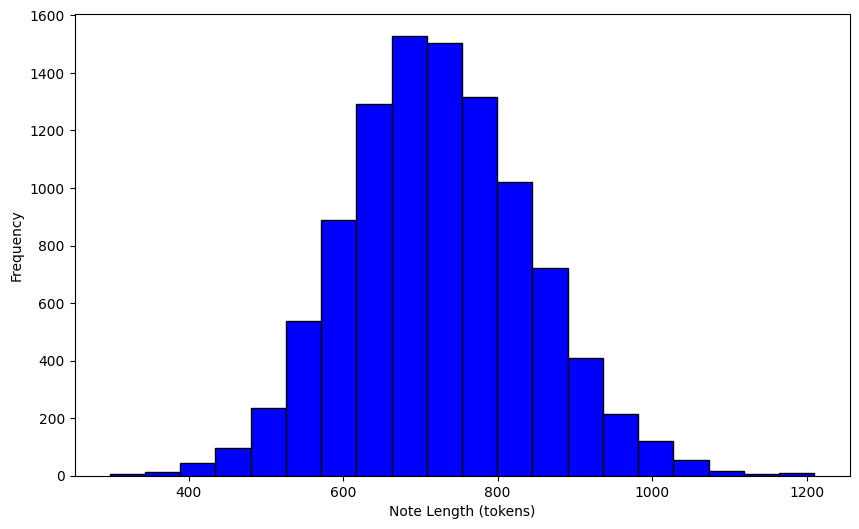

In [39]:
import matplotlib.pyplot as plt

# Assuming df is already defined and contains the note lengths
note_lengths = df['note_bert_subtoken_len']

# Create a histogram for the distribution of note token lengths without gridlines
plt.figure(figsize=(10, 6))
plt.hist(note_lengths, bins=20, color='blue', edgecolor='black')
#plt.title('Distribution of Note Token Lengths')
plt.xlabel('Note Length (tokens)')
plt.ylabel('Frequency')

# Show the plot
plt.show()


### 20 samples to compare with real data

In [27]:
# 20 random sapmle for the table comparing with real data:

seed = 42

# Randomly sample 20 rows from the DataFrame with the fixed seed
sampled_df = df.sample(n=20, random_state=seed)

# Calculate the required statistics on the sampled DataFrame
avg_turns = sampled_df['src_turnlen'].mean()
avg_dial_tokens_with_speakers = sampled_df['src_len_with_speakers'].mean()
avg_dial_tokens_without_speakers = sampled_df['src_len_without_speakers'].mean()
avg_note_tokens = sampled_df['note_len'].mean()
avg_note_sentences = sampled_df['note_sentlen'].mean()
avg_tokens_per_sentence = sampled_df['avg_tokens_per_sentence'].mean()

# Print the results
print("Average Number of Turns in Dialogue (Sampled):", avg_turns)
print("Average Number of Tokens in Dialogue (with speaker tokens) (Sampled):", avg_dial_tokens_with_speakers)
print("Average Number of Tokens in Dialogue (without speaker tokens) (Sampled):", avg_dial_tokens_without_speakers)
print("Average Number of Tokens in Notes (Sampled):", avg_note_tokens)
print("Average Number of Sentences in Notes (Sampled):", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes (Sampled):", avg_tokens_per_sentence)

Average Number of Turns in Dialogue (Sampled): 43.45
Average Number of Tokens in Dialogue (with speaker tokens) (Sampled): 1076.0
Average Number of Tokens in Dialogue (without speaker tokens) (Sampled): 969.55
Average Number of Tokens in Notes (Sampled): 617.5
Average Number of Sentences in Notes (Sampled): 23.4
Average Number of Tokens per Sentence in Notes (Sampled): 27.29944236426279


In [29]:
def recalculate_sentences(row):
    original_dialogue = row['polished_dial']

    # Calculate the number of sentences in the dialogue with speakers
    doc_with_speakers = nlp(original_dialogue)
    row['src_sentlen_with_speakers'] = len(list(doc_with_speakers.sents))

    # Remove speaker tokens and calculate the number of sentences in the dialogue without speakers
    dialogue_without_speakers = re.sub(r"\[\S+\]", "", original_dialogue)
    doc_without_speakers = nlp(dialogue_without_speakers)
    row['src_sentlen_without_speakers'] = len(list(doc_without_speakers.sents))

    return row

# Integrate tqdm with pandas
tqdm.pandas()

# Apply the sentence calculation function with a progress bar
sampled_df = sampled_df.progress_apply(recalculate_sentences, axis=1)

# Recalculate the average number of sentences
avg_sentences_with_speakers = sampled_df['src_sentlen_with_speakers'].mean()
avg_sentences_without_speakers = sampled_df['src_sentlen_without_speakers'].mean()

# Print the updated results
print("Average Number of Sentences in Dialogue (with speaker tokens):", avg_sentences_with_speakers)
print("Average Number of Sentences in Dialogue (without speaker tokens):", avg_sentences_without_speakers)

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

Average Number of Sentences in Dialogue (with speaker tokens): 57.1
Average Number of Sentences in Dialogue (without speaker tokens): 52.7


In [24]:
df.head()


,Unnamed: 0,Disease Description,Scenario,Note,Polished Note,Abbreviated Note,Role,dial,polished_dial,src_len_with_speakers,src_len_without_speakers,src_turnlen,note_len,note_sentlen,avg_tokens_per_sentence
0,0,PAIN IN LEFT KNEE,ROLE: Orthopedic Specialist\n\n1) Medical Outc...,**1. Subjective:**\n\n **Chief Complaint (CC...,**1. Subjective:** **Chief Complaint (CC):...,**1. Subjective:**\n\n **CC:**\n - L knee ...,Orthopedic Specialist,**Doctor:** Hello! It’s good to see you today....,[doctor]: Hello! It’s good to see you today. H...,1248,1033,54,447,20,22.350000
1,1,PAIN IN LEFT KNEE,ROLE: General Physician\n\n- **Medical Outcome...,**1. Subjective:**\n\n - **Chief Complaint (...,**1. Subjective:** - **Chief Complaint (CC...,**1. Subjective:**\n\n - **CC:** Pain in L k...,General Physician,**CHIEF COMPLAINT**\n\nPain in left knee.\n\n*...,"[doctor] Hi there, how are you today? [patien...",1216,1216,77,597,21,28.428571
2,2,PAIN IN LEFT KNEE,ROLE: Family Medicine Physician \n\n** 1) Medi...,#####\n**1. Subjective:**\n\n**Chief Complaint...,**1. Subjective:** **Chief Complaint (CC):** ...,**1. Subjective:**\n\n**CC:**\nSevere R hip pa...,Family Medicine Physician,"[doctor] Good morning, how are you doing today...","[doctor] Good morning, how are you doing today...",1100,1100,50,665,25,26.600000
3,3,PAIN IN LEFT KNEE,ROLE: Orthopedic Specialist\n\n**Scenario:**\n...,**1. Subjective:**\n\n**Chief Complaint (CC):*...,**1. Subjective:** **Chief Complaint (CC):** ...,**1. Subjective:**\n\n**CC:** \nModerate knee...,Orthopedic Specialist,[doctor] Good morning! How are you feeling tod...,[doctor] Good morning! How are you feeling tod...,1166,1166,57,657,26,25.269231
4,4,PAIN IN LEFT KNEE,ROLE: Orthopedic Specialist\n\n** Medical Outc...,#####\n**1. Subjective:**\n\n**Chief Complaint...,##### **1. Subjective:** **Chief Complaint (C...,#####\n**1. Subjective:**\n\n**CC:** \nModera...,Orthopedic Specialist,"[doctor]: Hello Mr. Doe, how are you doing tod...","[doctor]: Hello Mr. Doe, how are you doing tod...",1053,866,47,670,18,37.222222


### Train test split table:

In [49]:
train_df= pd.read_csv("/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/code/benchmarking/dataset/train.csv", sep= "|")
test_df= pd.read_csv("/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/code/benchmarking/dataset/test.csv", sep= "|")



In [50]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value
    
# Apply the cleaning function to the relevant columns
train_df['polished_dial'] = train_df['polished_dial'].apply(clean_text)
train_df['Polished Note'] = train_df['Polished Note'].apply(clean_text)

# Apply the cleaning function to the relevant columns
test_df['polished_dial'] = test_df['polished_dial'].apply(clean_text)
test_df['Polished Note'] = test_df['Polished Note'].apply(clean_text)

In [51]:

# Function to calculate the required metrics and add them to the row
def add_stats(row):
    # Original dialogue with speaker tokens
    original_dialogue = row['polished_dial']

    # Remove speaker tokens from the dialogue
    dialogue_without_speakers = re.sub(r"\[\S+\]", "", original_dialogue)

    # Tokenize the original dialogue (including speaker tokens) using SpaCy
    doc_with_speakers = nlp(original_dialogue)
    row['src_len_with_speakers'] = len(doc_with_speakers)

    # Tokenize the dialogue (excluding speaker tokens) using SpaCy
    doc_without_speakers = nlp(dialogue_without_speakers)
    row['src_len_without_speakers'] = len(doc_without_speakers)

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", original_dialogue))
    #row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc_note = nlp(row['Polished Note'])
    row['note_len'] = len(doc_note)

    # Calculate the number of sentences in the note using SpaCy's sentence detection
    sentences = list(doc_note.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row



In [52]:
# Integrate tqdm with pandas
tqdm.pandas()

# Apply the corrected turn calculation function with a progress bar
train_df = train_df.progress_apply(add_stats, axis=1)


  0%|          | 0/8529 [00:00<?, ?it/s]

100%|██████████| 8529/8529 [1:21:19<00:00,  1.75it/s]


In [53]:
test_df = test_df.progress_apply(add_stats, axis=1)


100%|██████████| 1506/1506 [14:25<00:00,  1.74it/s]


In [57]:
def recalculate_sentences(row):
    original_dialogue = row['polished_dial']

    # Calculate the number of sentences in the dialogue with speakers
    doc_with_speakers = nlp(original_dialogue)
    row['src_sentlen_with_speakers'] = len(list(doc_with_speakers.sents))

    # Remove speaker tokens and calculate the number of sentences in the dialogue without speakers
    dialogue_without_speakers = re.sub(r"\[\S+\]", "", original_dialogue)
    doc_without_speakers = nlp(dialogue_without_speakers)
    row['src_sentlen_without_speakers'] = len(list(doc_without_speakers.sents))

    return row

In [58]:
train_df = train_df.progress_apply(recalculate_sentences, axis=1)


100%|██████████| 8529/8529 [4:35:30<00:00,  1.94s/it]       


In [59]:
test_df= test_df.progress_apply(recalculate_sentences, axis=1)

100%|██████████| 1506/1506 [12:48<00:00,  1.96it/s]


In [60]:
train_df.to_csv("/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/code/benchmarking/dataset/train_with_stats_v2.csv", sep= "|")
test_df.to_csv("/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/code/benchmarking/dataset/test_with_stats_2.csv", sep= "|")


In [62]:
# Now you can calculate the required statistics
avg_turns = train_df['src_turnlen'].mean()
avg_dial_tokens_with_speakers = train_df['src_len_with_speakers'].mean()
avg_dial_tokens_without_speakers = train_df['src_len_without_speakers'].mean()
avg_note_tokens = train_df['note_len'].mean()
avg_note_sentences = train_df['note_sentlen'].mean()
avg_tokens_per_sentence = train_df['avg_tokens_per_sentence'].mean()
avg_dial_sentences_with_speakers= train_df["src_sentlen_with_speakers"].mean()
avg_dial_sentences_without_speakers= train_df["src_sentlen_without_speakers"].mean()


# Calculate the number of unique disease descriptions
unique_disease_descriptions = train_df['Disease Description'].nunique()


# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue (with speaker tokens):", avg_dial_tokens_with_speakers)
print("Average Number of Tokens in Dialogue (without speaker tokens):", avg_dial_tokens_without_speakers)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)
print("Number of Unique Disease Descriptions:", unique_disease_descriptions)
print("avg_dial_sentences_with_speakers:", avg_dial_sentences_with_speakers)
print("avg_dial_sentences_without_speakers:", avg_dial_sentences_without_speakers)

Average Number of Turns in Dialogue: 47.04842302731856
Average Number of Tokens in Dialogue (with speaker tokens): 1069.2975729862821
Average Number of Tokens in Dialogue (without speaker tokens): 930.5116660804315
Average Number of Tokens in Notes: 620.5423848047836
Average Number of Sentences in Notes: 23.154297103998125
Average Number of Tokens per Sentence in Notes: 27.839400430431436
Number of Unique Disease Descriptions: 2001
avg_dial_sentences_with_speakers: 55.26380583890257
avg_dial_sentences_without_speakers: 51.42689647086411


In [63]:

# Now you can calculate the required statistics
avg_turns = test_df['src_turnlen'].mean()
avg_dial_tokens_with_speakers = test_df['src_len_with_speakers'].mean()
avg_dial_tokens_without_speakers = test_df['src_len_without_speakers'].mean()
avg_note_tokens = test_df['note_len'].mean()
avg_note_sentences = test_df['note_sentlen'].mean()
avg_tokens_per_sentence = test_df['avg_tokens_per_sentence'].mean()
avg_dial_sentences_with_speakers= test_df["src_sentlen_with_speakers"].mean()
avg_dial_sentences_without_speakers= test_df["src_sentlen_without_speakers"].mean()
# Calculate the number of unique disease descriptions
unique_disease_descriptions = test_df['Disease Description'].nunique()

# Print the results
print("Average Number of Turns in Dialogue (Test Set):", avg_turns)
print("Average Number of Tokens in Dialogue (with speaker tokens) (Test Set):", avg_dial_tokens_with_speakers)
print("Average Number of Tokens in Dialogue (without speaker tokens) (Test Set):", avg_dial_tokens_without_speakers)
print("Average Number of Tokens in Notes (Test Set):", avg_note_tokens)
print("Average Number of Sentences in Notes (Test Set):", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes (Test Set):", avg_tokens_per_sentence)
print("Number of Unique Disease Descriptions (Test Set):", unique_disease_descriptions)
print("avg_dial_sentences_with_speakers:", avg_dial_sentences_with_speakers)
print("avg_dial_sentences_without_speakers:", avg_dial_sentences_without_speakers)

Average Number of Turns in Dialogue (Test Set): 46.865205843293495
Average Number of Tokens in Dialogue (with speaker tokens) (Test Set): 1076.2290836653387
Average Number of Tokens in Dialogue (without speaker tokens) (Test Set): 937.8718459495352
Average Number of Tokens in Notes (Test Set): 623.1394422310757
Average Number of Sentences in Notes (Test Set): 23.36454183266932
Average Number of Tokens per Sentence in Notes (Test Set): 27.722536148896012
Number of Unique Disease Descriptions (Test Set): 1131
avg_dial_sentences_with_speakers: 55.666002656042494
avg_dial_sentences_without_speakers: 52.30278884462152


## Number of Roles:

In [74]:
# the df with the counts:
import pandas as pd
df_v2= pd.read_csv('/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/data/output/notes_onVector/phase_2_to_12_combined/total_data_with_counts.csv', sep="|")

In [77]:
# how many unique roles?

df_v2["Role"].nunique()

285

In [78]:
df_v2[df_v2["Role"]== "Role not found in the first 5 lines."]

,Unnamed: 0.1,Unnamed: 0,Disease Description,Scenario,Note,Polished Note,Abbreviated Note,Role,dial,polished_dial,src_len_with_speakers,src_len_without_speakers,src_turnlen,note_len,note_sentlen,avg_tokens_per_sentence
5,5,5,"URINARY TRACT INFECTION, SITE NOT SPECIFIED",**ROLE:** Family Medicine Physician\n\n**1) Me...,#####\n\n**1. Subjective:**\n\n**Chief Complai...,**1. Subjective:** **Chief Complaint (CC):** ...,**1. Subjective:**\n\n**CC:**\n- Pt presents w...,Role not found in the first 5 lines.,"```markdown\n[doctor] Hi there, how are you to...","```markdown [doctor] Hi there, how are you tod...",897,897,42,652,20,32.600000
6,6,6,"URINARY TRACT INFECTION, SITE NOT SPECIFIED",**ROLE:** Family Medicine Physician\n\n**AGE:*...,#### EMERGENCY VISIT MEDICAL NOTE\n\n**1. Subj...,#### EMERGENCY VISIT MEDICAL NOTE **1. Subjec...,#### EMERGENCY VISIT MEDICAL NOTE\n\n**1. Subj...,Role not found in the first 5 lines.,**Doctor:** Good afternoon. How are you feelin...,[doctor]: Good afternoon. How are you feeling ...,1139,948,48,705,17,41.470588
7,7,7,"URINARY TRACT INFECTION, SITE NOT SPECIFIED",**ROLE:** Family Medicine Physician\n\n**Scena...,**1. Subjective:**\n\n**Chief Complaint (CC):*...,**1. Subjective:** **Chief Complaint (CC):** ...,**1. Subjective:**\n\n**CC:**\nFrequent urinat...,Role not found in the first 5 lines.,**Doctor:** Good morning! How are you doing to...,[doctor]: Good morning! How are you doing toda...,793,650,36,556,20,27.800000
20,20,20,LOW BACK PAIN,**ROLE:** Family Medicine Physician\n\n1) **Me...,**1. Subjective:**\n\n**Chief Complaint (CC):*...,**1. Subjective:** **Chief Complaint (CC):** ...,**1. Subjective:**\n\n**CC:**\nLower back pain...,Role not found in the first 5 lines.,"[doctor] Hello, how are you doing today?\n\n[p...","[doctor] Hello, how are you doing today? [pat...",1132,1132,54,664,29,22.896552
21,21,21,LOW BACK PAIN,**ROLE:** Orthopedic Specialist\n\n**SCENARIO ...,#####\n**1. Subjective:**\n\n**Chief Complaint...,##### **1. Subjective:** **Chief Complaint (C...,#####\n**1. Subjective:**\n\n**CC:**\nSevere L...,Role not found in the first 5 lines.,**Conversation Transcript:**\n\n**Doctor:** Hi...,"[doctor]: Hi Mr. Jones, how are you feeling to...",973,786,47,613,26,23.576923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10005,10005,15,"UNSPECIFIED HEARING LOSS, UNSPECIFIED EAR",**ROLE:** Otolaryngologist\n\n**1) Medical Out...,#####\n**1. Subjective:**\n\n**Chief Complaint...,##### **1. Subjective:** **Chief Complaint (C...,#####\n**1. Subjective:**\n\n**CC:**\nHearing ...,Role not found in the first 5 lines.,"[doctor] Hi there, how are you today? \n\n[pat...","[doctor] Hi there, how are you today? [patien...",943,943,43,469,17,27.588235
10007,10007,17,"UNSPECIFIED HEARING LOSS, UNSPECIFIED EAR",**ROLE:** Otolaryngologist (ENT Specialist)\n\...,#####\n**SUBJECTIVE**\n\n**Chief Complaint (CC...,##### **1. Subjective:** **Chief Complaint (C...,#####\n**1. Subjective:**\n\n**CC:**\nHearing ...,Role not found in the first 5 lines.,"```\n[doctor] Good morning, John. How are you ...","[doctor]: Good morning, John. How are you doin...",1077,902,44,584,21,27.809524
10022,10022,32,"BIPOLAR DISORDER, CURRENT EPISODE DEPRESSED, S...",**ROLE:**\nPsychiatrist\n\n**Scenario:**\n\n- ...,### Medical Note\n\n**1. Subjective:**\n\n**CH...,### Medical Note **1. Subjective:** **CHIEF ...,### Medical Note\n\n**1. Subjective:**\n\n**CC...,Role not found in the first 5 lines.,"**Doctor:** Good morning, how are you feeling ...","[doctor]: Good morning, how are you feeling to...",1067,884,46,633,28,22.607143
10029,10029,39,NIPPLE DISCHARGE,**ROLE:** Family Medicine Physician\n\n**Scena...,#####\n**1. Subjective:**\n\n**Chief Complaint...,##### **1. Subjective:** **Chief Complaint (C...,#####\n**1. Subjective:**\n\n**CC:** \nNipple ...,Role not found in the first 5 lines.,**Doctor:** Good morning! How are you doing to...,[doctor]: Good morning! How are you doing toda...,1169,950,55,564,20,28.

In [79]:
import re

def update_role(df):
    # Regex pattern to extract role from Scenario column
    pattern = r"\*\*ROLE:\*\*\s*([^\n]+)"

    # Iterate over the DataFrame
    for index, row in df.iterrows():
        # Check if the Role is 'Role not found in the first 5 lines.'
        if row['Role'] == "Role not found in the first 5 lines.":
            # Extract the role from the Scenario column
            match = re.search(pattern, row['Scenario'])
            if match:
                # If a role is found, update the Role column at that index
                df.at[index, 'Role'] = match.group(1)
            else:
                # If no role is found, optionally update the Role to something else, e.g., 'Role Undefined'
                df.at[index, 'Role'] = 'Role Undefined'

# Example usage
# Assuming df is your DataFrame and it's already defined
update_role(df_v2)

In [80]:
df_v2[df_v2["Role"]== "Role not found in the first 5 lines."]

,Unnamed: 0.1,Unnamed: 0,Disease Description,Scenario,Note,Polished Note,Abbreviated Note,Role,dial,polished_dial,src_len_with_speakers,src_len_without_speakers,src_turnlen,note_len,note_sentlen,avg_tokens_per_sentence


In [81]:
df_v2["Role"].nunique()

306

In [82]:
for role, num in df_v2["Role"].value_counts().items():
    print(role)
    print(num)
    print(10*"*")

Family Medicine Physician
1911
**********
Orthopedic Specialist
594
**********
Neurologist
576
**********
General Physician
533
**********
Gastroenterologist
514
**********
Cardiologist
484
**********
Dermatologist
361
**********
Pulmonologist
320
**********
Oncologist
318
**********
Endocrinologist
303
**********
Ophthalmologist
296
**********
Obstetrician
284
**********
Urologist
273
**********
Orthopedic Surgeon
231
**********
General Surgeon
219
**********
Gynecologist
194
**********
Psychiatrist
189
**********
Nephrologist
161
**********
Hematologist
156
**********
Rheumatologist
150
**********
Infectious Disease Specialist
133
**********
Otolaryngologist (ENT Specialist)
111
**********
Emergency Medicine Physician
100
**********
Obstetrician-Gynecologist (OB-GYN)
91
**********
Vascular Surgeon
78
**********
Pediatrician
72
**********
Role Undefined
60
**********
Obstetrician-Gynecologist
60
**********
Otolaryngologist
57
**********
Family Medicine Physician**
44
**********
Hepato

In [83]:
# there are some extra stuff in some of the roles, like: Family Medicine Physician**
# Needs cleaning

def clean_role(role_str):
    # Clean up the role by removing unwanted characters
    cleaned_role = re.sub(r"[^\w\s]+$", "", role_str)
    return cleaned_role

df_v2['Role'] = df_v2['Role'].apply(clean_role)


In [84]:
df_v2[df_v2["Role"]== "Role not found in the first 5 lines."]

,Unnamed: 0.1,Unnamed: 0,Disease Description,Scenario,Note,Polished Note,Abbreviated Note,Role,dial,polished_dial,src_len_with_speakers,src_len_without_speakers,src_turnlen,note_len,note_sentlen,avg_tokens_per_sentence


In [85]:
df_v2["Role"].nunique()

258

In [86]:
for role, num in df_v2["Role"].value_counts().items():
    print(role)
    print(num)
    print(10*"*")

Family Medicine Physician
1960
**********
Orthopedic Specialist
613
**********
Neurologist
584
**********
General Physician
556
**********
Gastroenterologist
526
**********
Cardiologist
490
**********
Dermatologist
371
**********
Pulmonologist
326
**********
Oncologist
326
**********
Endocrinologist
305
**********
Ophthalmologist
296
**********
Obstetrician
289
**********
Urologist
283
**********
Orthopedic Surgeon
233
**********
General Surgeon
221
**********
Gynecologist
196
**********
Psychiatrist
193
**********
Nephrologist
166
**********
Hematologist
159
**********
Rheumatologist
153
**********
Infectious Disease Specialist
136
**********
Otolaryngologist (ENT Specialist
113
**********
Emergency Medicine Physician
101
**********
Obstetrician-Gynecologist (OB-GYN
91
**********
Vascular Surgeon
80
**********
Pediatrician
72
**********
Obstetrician-Gynecologist
63
**********
Role Undefined
60
**********
Otolaryngologist
58
**********
Hepatologist
39
**********
Hematologist-Oncologist

In [89]:
import pandas as pd

def categorize_role_frequencies(df):
    # Calculate the frequency of each role
    role_counts = df['Role'].value_counts()

    ranges = {
        'More than 1000': role_counts[role_counts > 1000].shape[0],
        'Between 500 and 1000': role_counts[(role_counts > 500) & (role_counts <= 1000)].shape[0],
        'Between 100 and 500': role_counts[(role_counts > 100) & (role_counts <= 500)].shape[0],
        'Between 50 and 100': role_counts[(role_counts > 50) & (role_counts <= 100)].shape[0],
        'Between 10 and 50': role_counts[(role_counts > 10) & (role_counts <= 50)].shape[0],
        'Below 10': role_counts[role_counts <= 10].shape[0]
    }

    ranges_df = pd.DataFrame(list(ranges.items()), columns=['Range', 'Count'])

    latex_table = ranges_df.to_latex(index=False)

    return ranges_df, latex_table

ranges_df, latex_output = categorize_role_frequencies(df_v2)
print(latex_output)


\begin{tabular}{lr}
\toprule
Range & Count \\
\midrule
More than 1000 & 1 \\
Between 500 and 1000 & 4 \\
Between 100 and 500 & 18 \\
Between 50 and 100 & 6 \\
Between 10 and 50 & 26 \\
Below 10 & 203 \\
\bottomrule
\end{tabular}



## NoteChat

In [1]:
import datasets

data= datasets.load_dataset("akemiH/NoteChat")
data

DatasetDict({
    train: Dataset({
        features: ['data', 'conversation'],
        num_rows: 207001
    })
})

In [2]:
# Access the train split
train_dataset = data['train']

# Convert the train dataset to a list of dictionaries: 100 samples
data_to_process = [{'data': x['data'], 'conversation': x['conversation']} for x in train_dataset]
data_to_process

[{'data': 'This 60-year-old male was hospitalized due to moderate ARDS from COVID-19 with symptoms of fever, dry cough, and dyspnea. We encountered several difficulties during physical therapy on the acute ward. First, any change of position or deep breathing triggered coughing attacks that induced oxygen desaturation and dyspnea. To avoid rapid deterioration and respiratory failure, we instructed and performed position changes very slowly and step-by-step. In this way, a position change to the 135° prone position () took around 30 minutes. This approach was well tolerated and increased oxygen saturation, for example, on day 5 with 6 L/min of oxygen from 93% to 97%. Second, we had to adapt the breathing exercises to avoid prolonged coughing and oxygen desaturation. Accordingly, we instructed the patient to stop every deep breath before the need to cough and to hold inspiration for better air distribution. In this manner, the patient performed the breathing exercises well and managed to

In [3]:
import spacy
import re

# Load SpaCy language model
nlp = spacy.load("en_core_sci_lg")
''' 
def add_stats_NoteChat(row):
    # Access the conversation from the row; adjust 'conversation' if the field is named differently
    conversation = row['conversation']

    # Tokenize the conversation including speaker tokens using SpaCy
    doc_with_speakers = nlp(conversation)
    row['conversation_token_len'] = len(doc_with_speakers)
    
    # Calculate the number of turns in the conversation (assuming turns are marked by speaker tokens)
    row['conversation_turn_len'] = len(re.findall(r"\bDoctor:|\bPatient:", conversation))
        
    # Assuming 'data' field contains the note; adjust 'data' if the field is named differently
    note = row['data']
    
    # Tokenize the note and calculate the number of tokens
    doc_note = nlp(note)
    row['note_token_len'] = len(doc_note)
    
    # Calculate the number of sentences in the note using SpaCy's sentence detection
    sentences = list(doc_note.sents)
    row['note_sentence_len'] = len(sentences)

    return row
''' 
def add_stats_NoteChat(row):
    doc_with_speakers = nlp(row['conversation'])
    row['conversation_token_len'] = len(doc_with_speakers)
    
    row['conversation_turn_len'] = len(re.findall(r"\bDoctor:|\bPatient:", row['conversation']))
    
    doc_note = nlp(row['data'])
    row['note_token_len'] = len(doc_note)
    row['note_sentence_len'] = len(list(doc_note.sents))
    
    return row


/Users/ahmadrezaie/miniforge3/lib/python3.10/site-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


In [4]:
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed


results = []
with ThreadPoolExecutor(max_workers=8) as executor:
    # Submit all tasks to the executor
    future_to_row = {executor.submit(add_stats_NoteChat, row): row for row in data_to_process}
    
    for future in as_completed(future_to_row):
        res = future.result()
        results.append(res)
        print(f"Processed {len(results)}/{len(data_to_process)} tasks.")

# Convert results to DataFrame
df = pd.DataFrame(results)

# Saving the DataFrame as CSV or any other format
df.to_csv("/Users/ahmadrezaie/2_My_papers/Synthetic_Data_Gen/data/output/processed_NoteChat_data.csv", index=False)


Processed 1/207001 tasks.
Processed 2/207001 tasks.
Processed 3/207001 tasks.
Processed 4/207001 tasks.
Processed 5/207001 tasks.
Processed 6/207001 tasks.
Processed 7/207001 tasks.
Processed 8/207001 tasks.
Processed 9/207001 tasks.
Processed 10/207001 tasks.
Processed 11/207001 tasks.
Processed 12/207001 tasks.
Processed 13/207001 tasks.
Processed 14/207001 tasks.
Processed 15/207001 tasks.
Processed 16/207001 tasks.
Processed 17/207001 tasks.
Processed 18/207001 tasks.
Processed 19/207001 tasks.
Processed 20/207001 tasks.
Processed 21/207001 tasks.
Processed 22/207001 tasks.
Processed 23/207001 tasks.
Processed 24/207001 tasks.
Processed 25/207001 tasks.
Processed 26/207001 tasks.
Processed 27/207001 tasks.
Processed 28/207001 tasks.
Processed 29/207001 tasks.
Processed 30/207001 tasks.
Processed 31/207001 tasks.
Processed 32/207001 tasks.
Processed 33/207001 tasks.
Processed 34/207001 tasks.
Processed 35/207001 tasks.
Processed 36/207001 tasks.
Processed 37/207001 tasks.
Processed 

In [5]:
df.head()

,data,conversation,conversation_token_len,conversation_turn_len,note_token_len,note_sentence_len
0,A 39-year-old man was hospitalized due to an i...,"\nDoctor: Hello, I am Dr. Smith. Can you tell ...",376,15,255,9
1,This 60-year-old male was hospitalized due to ...,"\nDoctor: Hi, Mr. X, I'm Dr. Y. How are you fe...",507,24,246,12
2,One week after a positive COVID-19 result this...,"\nDoctor: Good morning, how are you feeling to...",488,25,220,10
3,This 33-year-old female patient had typical CO...,"Doctor: Hello, how are you feeling today?\nPat...",418,22,219,10
4,This 57-year-old male was admitted to the ICU ...,"\nDoctor: Good morning, Mr. Patient. How are y...",516,24,248,12


In [6]:

# Calculating the mean of the specified columns
mean_conversation_token_len = df['conversation_token_len'].mean()
mean_conversation_turn_len = df['conversation_turn_len'].mean()
mean_note_token_len = df['note_token_len'].mean()
mean_note_sentence_len = df['note_sentence_len'].mean()

# Printing out the results
print("Mean Conversation Token Length:", mean_conversation_token_len)
print("Mean Conversation Turn Length:", mean_conversation_turn_len)
print("Mean Note Token Length:", mean_note_token_len)
print("Mean Note Sentence Length:", mean_note_sentence_len)

Mean Conversation Token Length: 561.4228385370119
Mean Conversation Turn Length: 27.088241119608117
Mean Note Token Length: 301.17944357756727
Mean Note Sentence Length: 14.215651132120135


## ACI-BENCH train data

In [45]:
import re
import pandas as pd
import spacy

In [46]:
# Load the Spacy model
nlp = spacy.load("en_core_sci_lg")

In [47]:
# Read the dataset with the specified file path and separator
df = pd.read_csv('C:\\Users\\SAFIR2023\\Desktop\\check\\train.csv')

In [48]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value

In [49]:
# Apply the cleaning function to the relevant columns
df['dialogue'] = df['dialogue'].apply(clean_text)
df['note'] = df['note'].apply(clean_text)

In [50]:
# Function to calculate the required metrics
def add_lengths(row):
    # Calculate the number of tokens in the dialogue
    row['src_len'] = len(row['dialogue'].split())

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc = nlp(row['note'])
    row['note_len'] = len(doc)

    # Calculate the number of sentences using SpaCy's sentence detection
    sentences = list(doc.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row

In [51]:
# Apply the add_lengths function to each row
df = df.apply(lambda row: add_lengths(row), axis=1)

In [52]:
# Calculate the required statistics
avg_turns = df['src_turnlen'].mean()
avg_dial_tokens = df['src_len'].mean()
avg_note_tokens = df['note_len'].mean()
avg_note_sentences = df['note_sentlen'].mean()
avg_tokens_per_sentence = df['avg_tokens_per_sentence'].mean()

In [53]:
# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue:", avg_dial_tokens)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)

Average Number of Turns in Dialogue: 55.74626865671642
Average Number of Tokens in Dialogue: 1301.2238805970148
Average Number of Tokens in Notes: 503.64179104477614
Average Number of Sentences in Notes: 34.32835820895522
Average Number of Tokens per Sentence in Notes: 14.928890367213521


**ACI-BENCH clef_taskC_test3.csv**

In [54]:
import re
import pandas as pd
import spacy

In [55]:
# Load the Spacy model
nlp = spacy.load("en_core_sci_lg")

In [56]:
# Read the dataset with the specified file path and separator
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\New folder\\aci-bench\\data\\challenge_data\\clef_taskC_test3.csv")

In [59]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value

In [60]:
# Apply the cleaning function to the relevant columns
df['dialogue'] = df['dialogue'].apply(clean_text)
df['note'] = df['note'].apply(clean_text)

In [61]:
# Function to calculate the required metrics
def add_lengths(row):
    # Calculate the number of tokens in the dialogue
    row['src_len'] = len(row['dialogue'].split())

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc = nlp(row['note'])
    row['note_len'] = len(doc)

    # Calculate the number of sentences using SpaCy's sentence detection
    sentences = list(doc.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row

In [62]:
# Apply the add_lengths function to each row
df = df.apply(lambda row: add_lengths(row), axis=1)

In [63]:
# Calculate the required statistics
avg_turns = df['src_turnlen'].mean()
avg_dial_tokens = df['src_len'].mean()
avg_note_tokens = df['note_len'].mean()
avg_note_sentences = df['note_sentlen'].mean()
avg_tokens_per_sentence = df['avg_tokens_per_sentence'].mean()

In [64]:
# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue:", avg_dial_tokens)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)

Average Number of Turns in Dialogue: 58.375
Average Number of Tokens in Dialogue: 1333.95
Average Number of Tokens in Notes: 537.2
Average Number of Sentences in Notes: 37.975
Average Number of Tokens per Sentence in Notes: 14.240889369967359


**ACI-BENCH clinicalnlp_taskB_test1.csv**

In [65]:
import re
import pandas as pd
import spacy

In [66]:
# Load the Spacy model
nlp = spacy.load("en_core_sci_lg")

In [67]:
# Read the dataset with the specified file path and separator
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\New folder\\aci-bench\\data\\challenge_data\\clinicalnlp_taskB_test1.csv")

In [68]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value

In [69]:
# Apply the cleaning function to the relevant columns
df['dialogue'] = df['dialogue'].apply(clean_text)
df['note'] = df['note'].apply(clean_text)

In [70]:
# Function to calculate the required metrics
def add_lengths(row):
    # Calculate the number of tokens in the dialogue
    row['src_len'] = len(row['dialogue'].split())

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc = nlp(row['note'])
    row['note_len'] = len(doc)

    # Calculate the number of sentences using SpaCy's sentence detection
    sentences = list(doc.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row

In [71]:
# Apply the add_lengths function to each row
df = df.apply(lambda row: add_lengths(row), axis=1)

In [72]:
# Calculate the required statistics
avg_turns = df['src_turnlen'].mean()
avg_dial_tokens = df['src_len'].mean()
avg_note_tokens = df['note_len'].mean()
avg_note_sentences = df['note_sentlen'].mean()
avg_tokens_per_sentence = df['avg_tokens_per_sentence'].mean()

In [73]:
# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue:", avg_dial_tokens)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)

Average Number of Turns in Dialogue: 52.05
Average Number of Tokens in Dialogue: 1231.425
Average Number of Tokens in Notes: 505.1
Average Number of Sentences in Notes: 35.625
Average Number of Tokens per Sentence in Notes: 14.306854673607154


**ACI-BENCH clinicalnlp_taskC_test2.csv**

In [74]:
import re
import pandas as pd
import spacy

In [75]:
# Load the Spacy model
nlp = spacy.load("en_core_sci_lg")

In [76]:
# Read the dataset with the specified file path and separator
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\New folder\\aci-bench\\data\\challenge_data\\clinicalnlp_taskC_test2.csv")

In [77]:
# Function to clean the text by removing \n and other unnecessary characters
def clean_text(text):
    if isinstance(text, str):
        return text.replace('\n', ' ').strip()
    else:
        return ""  # or return text if you prefer to keep the original value

In [78]:
# Apply the cleaning function to the relevant columns
df['dialogue'] = df['dialogue'].apply(clean_text)
df['note'] = df['note'].apply(clean_text)

In [79]:
# Function to calculate the required metrics
def add_lengths(row):
    # Calculate the number of tokens in the dialogue
    row['src_len'] = len(row['dialogue'].split())

    # Calculate the number of turns in the dialogue (number of times [doctor]: or [patient]: appears)
    row['src_turnlen'] = len(re.findall(r"\[\S+\]", row['dialogue']))

    # Tokenize the note and calculate the number of tokens
    doc = nlp(row['note'])
    row['note_len'] = len(doc)

    # Calculate the number of sentences using SpaCy's sentence detection
    sentences = list(doc.sents)
    row['note_sentlen'] = len(sentences)
    
    # Calculate the average number of tokens per sentence in the note
    if row['note_sentlen'] > 0:
        row['avg_tokens_per_sentence'] = row['note_len'] / row['note_sentlen']
    else:
        row['avg_tokens_per_sentence'] = 0

    return row

In [80]:
# Apply the add_lengths function to each row
df = df.apply(lambda row: add_lengths(row), axis=1)

In [81]:
# Calculate the required statistics
avg_turns = df['src_turnlen'].mean()
avg_dial_tokens = df['src_len'].mean()
avg_note_tokens = df['note_len'].mean()
avg_note_sentences = df['note_sentlen'].mean()
avg_tokens_per_sentence = df['avg_tokens_per_sentence'].mean()

In [82]:
# Print the results
print("Average Number of Turns in Dialogue:", avg_turns)
print("Average Number of Tokens in Dialogue:", avg_dial_tokens)
print("Average Number of Tokens in Notes:", avg_note_tokens)
print("Average Number of Sentences in Notes:", avg_note_sentences)
print("Average Number of Tokens per Sentence in Notes:", avg_tokens_per_sentence)

Average Number of Turns in Dialogue: 55.8
Average Number of Tokens in Dialogue: 1382.425
Average Number of Tokens in Notes: 531.375
Average Number of Sentences in Notes: 37.65
Average Number of Tokens per Sentence in Notes: 14.33916786065079


**Calculating the frequency of SOURCE (for our data)**

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

In [84]:
# 1. Convert all entries in 'Polished Note' to strings, replacing NaN with an empty string
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\paper\\total_data.csv", sep = "|")
df['polished_dial'] = df['polished_dial'].astype(str).fillna('')

# 2. Remove newline characters from the 'polished_dial' column
df['polished_dial'] = df['polished_dial'].str.replace('\n', '')

In [85]:
# 4. Function to count tokens in a text
def count_tokens(text):
    doc = nlp(text)
    return len(doc)

# 5. Apply the token counting function to each row in 'polished_dial'
df['token_count'] = df['polished_dial'].apply(count_tokens)

# 6. Plot the histogram of token counts
plt.figure(figsize=(10, 6))
plt.hist(df['token_count'], bins=50, range=(0, 2000), color='blue', edgecolor='black')

# 7. Set the title and labels
plt.title('Frequency Distribution of Token Counts', fontsize=16)
plt.xlabel('Subtoken Length', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# 8. Save the plot as an image
plt.tight_layout()
plt.savefig('token_count_histogram.png')

# 9. Show the plot
plt.show()

KeyboardInterrupt: 

**Calculating the frequency of TARGET**

In [21]:
# 1. Convert all entries in 'Polished Note' to strings, replacing NaN with an empty string
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\paper\\total_data.csv", sep = "|")
df['Polished Note'] = df['Polished Note'].astype(str).fillna('')

# 2. Remove newline characters from the 'polished_dial' column
df['Polished Note'] = df['Polished Note'].str.replace('\n', '')
df['Polished Note'] = df['Polished Note'].str.replace('*', '')

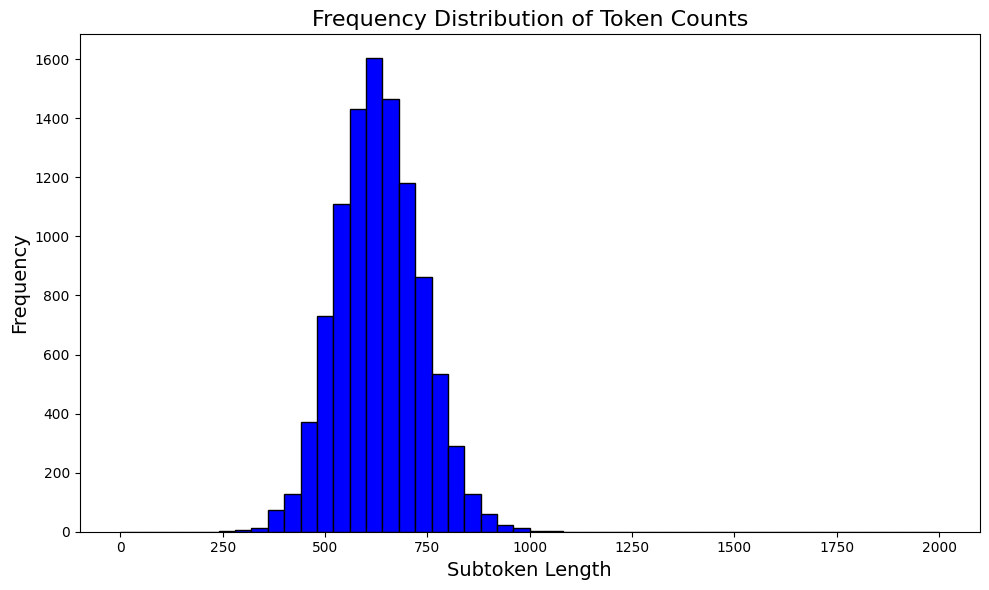

In [22]:
# 4. Function to count tokens in a text
def count_tokens(text):
    doc = nlp(text)
    return len(doc)

# 5. Apply the token counting function to each row in 'polished_dial'
df['token_count'] = df['Polished Note'].apply(count_tokens)

# 6. Plot the histogram of token counts
plt.figure(figsize=(10, 6))
plt.hist(df['token_count'], bins=50, range=(0, 2000), color='blue', edgecolor='black')

# 7. Set the title and labels
plt.title('Frequency Distribution of Token Counts', fontsize=16)
plt.xlabel('Subtoken Length', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# 8. Save the plot as an image
plt.tight_layout()
plt.savefig('token_count_histogram_for_TARGET.png')

# 9. Show the plot
plt.show()

**Calculate the avg of turns**

In [23]:
# 1. Convert all entries in 'polished_dial' to strings, replacing NaN with an empty string
df = pd.read_csv("C:\\Users\\SAFIR2023\\Desktop\\paper\\total_data.csv", sep = "|")
df['polished_dial'] = df['polished_dial'].astype(str).fillna('')

# 2. Function to count the number of turns in a dialog
def count_turns(text):
    # Split the text by speaker tags to identify turns
    turns = text.split('[')
    # Exclude any empty splits and count the rest
    num_turns = len([turn for turn in turns if turn.strip()])
    return num_turns

# 3. Apply the turn counting function to each row in 'polished_dial'
df['turn_count'] = df['polished_dial'].apply(count_turns)

# 4. Calculate the average number of turns per dialog
avg_turn_count = df['turn_count'].mean()

# 5. Print the average number of turns
print(f"Average number of turns per dialog: {avg_turn_count:.2f}")


Average number of turns per dialog: 47.45
